In [1]:
!pip install -q imageio
!pip install -q opencv-python
!pip install -q git+https://github.com/tensorflow/docs

In [2]:
import tensorflow as tf
import tensorflow_hub as hub
from tensorflow_docs.vis import embed
from absl import logging
logging.set_verbosity(logging.ERROR)

import random
import re
import os
import tempfile
import ssl
import cv2
import numpy as np

import imageio
from IPython import display
from urllib import request

In [3]:
UCF_ROOT = "https://www.crcv.ucf.edu/THUMOS14/UCF101/UCF101/"
_VIDEO_LIST = None
_CACHE_DIR = tempfile.mkdtemp()
unverified_context = ssl._create_unverified_context()

def list_UCF():
  global _VIDEO_LIST
  if not _VIDEO_LIST:
    index = request.urlopen(UCF_ROOT, context=unverified_context).read().decode("utf-8")
    videos = re.findall("(v_[\w_]+\.avi)", index)
    _VIDEO_LIST = sorted(set(videos))
  return list(_VIDEO_LIST)

def fetch_ucf_video(video):
  cache_path = os.path.join(_CACHE_DIR, video)
  if not os.path.exists(cache_path):
    urlpath = request.urljoin(UCF_ROOT, video)
    print("Fetching %s => %s" % (urlpath, cache_path))
    data = request.urlopen(urlpath, context=unverified_context).read()
    open(cache_path, "wb").write(data)
  return cache_path

In [4]:
def crop_center_square(frame):
  y, x = frame.shape[0:2]
  min_dim = min(y, x)
  start_x = (x // 2) - (min_dim // 2)
  start_y = (y // 2) - (min_dim // 2)
  return frame[start_y:start_y+min_dim,start_x:start_x+min_dim]

def load_video(path, max_frames=0, resize=(224, 224)):
  cap = cv2.VideoCapture(path)
  frames = []
  try:
    while True:
      ret, frame = cap.read()
      if not ret:
        break
      frame = crop_center_square(frame)
      frame = cv2.resize(frame, resize)
      frame = frame[:, :, [2, 1, 0]]
      frames.append(frame)
      
      if len(frames) == max_frames:
        break
  finally:
    cap.release()
  return np.array(frames) / 255.0

def to_gif(video):
  converted_video = np.clip(video * 255, 0, 255).astype(np.uint8)
  imageio.mimsave('./animation.gif', converted_video, fps=25)
  return embed.embed_file('./animation.gif')

In [5]:
'''
!pip install pyautogui 
import pyautogui
import time
from random_qoute import write_in_txt
import random
screenWidth, screenHeight = pyautogui.size()

print("please point the mouse on the target point and press Crtl+C ")

try:
    while True:
        targetMouseX, targetMouseY = pyautogui.position()
        print(targetMouseX, targetMouseY, end="\r")
        time.sleep(0.1)
except KeyboardInterrupt:
    print(f"target Point is {targetMouseX},{targetMouseY}")


# move mouse to target position and click
pyautogui.moveTo(targetMouseX, targetMouseY, duration=1)

pyautogui.click()

write_in_txt("qoutes")
qoutes_set = {x.rstrip() for x in open("qoutes.txt")}
len_qoutes_set = len(qoutes_set)

while True:
    # get a random qoute in list format
    random_qoute = list(qoutes_set)[random.randint(0, len_qoutes_set)]
    random_qoute_list = random_qoute.split(" ")

    for word in random_qoute_list:
        random_interval = random.random()
        pyautogui.write(f"{word} ", interval=random_interval / 3.0)
    pyautogui.hotkey("ctrl", "a", "backspace")
'''

'\n!pip install pyautogui \nimport pyautogui\nimport time\nfrom random_qoute import write_in_txt\nimport random\nscreenWidth, screenHeight = pyautogui.size()\n\nprint("please point the mouse on the target point and press Crtl+C ")\n\ntry:\n    while True:\n        targetMouseX, targetMouseY = pyautogui.position()\n        print(targetMouseX, targetMouseY, end="\r")\n        time.sleep(0.1)\nexcept KeyboardInterrupt:\n    print(f"target Point is {targetMouseX},{targetMouseY}")\n\n\n# move mouse to target position and click\npyautogui.moveTo(targetMouseX, targetMouseY, duration=1)\n\npyautogui.click()\n\nwrite_in_txt("qoutes")\nqoutes_set = {x.rstrip() for x in open("qoutes.txt")}\nlen_qoutes_set = len(qoutes_set)\n\nwhile True:\n    # get a random qoute in list format\n    random_qoute = list(qoutes_set)[random.randint(0, len_qoutes_set)]\n    random_qoute_list = random_qoute.split(" ")\n\n    for word in random_qoute_list:\n        random_interval = random.random()\n        pyautogui.w

In [6]:
#kinetics-400 labels
KINETICS_URL = "https://raw.githubusercontent.com/deepmind/kinetics-i3d/master/data/label_map.txt"
with request.urlopen(KINETICS_URL) as obj:
  labels = [line.decode("utf-8").strip() for line in obj.readlines()]

print(f"Total:{len(labels)} labels")

Total:400 labels


In [7]:
#UCF Dataset
ucf_videos = list_UCF()
categories = {}
for video in ucf_videos:
  category = video[2:-12]
  if category not in categories:
    categories[category] = []
  categories[category].append(video)
print(f"Videos: {len(ucf_videos)}\n Categories:{len(categories)}")

print("\n")
head1 = "Category"
head2 = "Total videos"
print(" ",head1," \t  ",head2)
for category, sequences in categories.items():
  summary = ", ".join(sequences[:2])
  print("%-20s    %4d" % (category, len(sequences)))

Videos: 13320
 Categories:101


  Category  	   Total videos
ApplyEyeMakeup           145
ApplyLipstick            114
Archery                  145
BabyCrawling             132
BalanceBeam              108
BandMarching             155
BaseballPitch            150
BasketballDunk           131
Basketball               134
BenchPress               160
Biking                   134
Billiards                150
BlowDryHair              131
BlowingCandles           109
BodyWeightSquats         112
Bowling                  155
BoxingPunchingBag        163
BoxingSpeedBag           134
BreastStroke             101
BrushingTeeth            131
CleanAndJerk             112
CliffDiving              138
CricketBowling           139
CricketShot              167
CuttingInKitchen         110
Diving                   150
Drumming                 161
Fencing                  111
FieldHockeyPenalty       126
FloorGymnastics          125
FrisbeeCatch             126
FrontCrawl               137
GolfSwing  

In [8]:
for category, sequences in categories.items():
  summary = ", ".join(sequences[:2])
  print("%-20s   %s" % (category, summary))

ApplyEyeMakeup         v_ApplyEyeMakeup_g01_c01.avi, v_ApplyEyeMakeup_g01_c02.avi
ApplyLipstick          v_ApplyLipstick_g01_c01.avi, v_ApplyLipstick_g01_c02.avi
Archery                v_Archery_g01_c01.avi, v_Archery_g01_c02.avi
BabyCrawling           v_BabyCrawling_g01_c01.avi, v_BabyCrawling_g01_c02.avi
BalanceBeam            v_BalanceBeam_g01_c01.avi, v_BalanceBeam_g01_c02.avi
BandMarching           v_BandMarching_g01_c01.avi, v_BandMarching_g01_c02.avi
BaseballPitch          v_BaseballPitch_g01_c01.avi, v_BaseballPitch_g01_c02.avi
BasketballDunk         v_BasketballDunk_g01_c01.avi, v_BasketballDunk_g01_c02.avi
Basketball             v_Basketball_g01_c01.avi, v_Basketball_g01_c02.avi
BenchPress             v_BenchPress_g01_c01.avi, v_BenchPress_g01_c02.avi
Biking                 v_Biking_g01_c01.avi, v_Biking_g01_c02.avi
Billiards              v_Billiards_g01_c01.avi, v_Billiards_g01_c02.avi
BlowDryHair            v_BlowDryHair_g01_c01.avi, v_BlowDryHair_g01_c02.avi
BlowingCandles

In [9]:
i3d = hub.load("https://tfhub.dev/deepmind/i3d-kinetics-400/1").signatures['default']

In [10]:
def act_Recog(sample_video):

  model_input = tf.constant(sample_video, dtype=tf.float32)[tf.newaxis, ...]

  logits = i3d(model_input)['default'][0]
  probabilities = tf.nn.softmax(logits)

  print("Most likely to be:")
  for i in np.argsort(probabilities)[::-1][:10]:
    print(f"  {labels[i]:22}: {probabilities[i] * 100:5.2f}%")

In [11]:
video_path = fetch_ucf_video("v_MilitaryParade_g01_c02.avi")
sample_video = load_video(video_path)
sample_video1 = load_video(video_path)[:100]
sample_video.shape

Fetching https://www.crcv.ucf.edu/THUMOS14/UCF101/UCF101/v_MilitaryParade_g01_c02.avi => /tmp/tmpuo9g5m4q/v_MilitaryParade_g01_c02.avi


(127, 224, 224, 3)


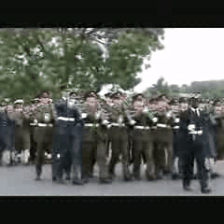

In [12]:
to_gif(sample_video1)

In [14]:
act_Recog(sample_video)

Most likely to be:
  marching              : 100.00%
  high kick             :  0.00%
  playing trumpet       :  0.00%
  playing trombone      :  0.00%
  unloading truck       :  0.00%
  garbage collecting    :  0.00%
  jumpstyle dancing     :  0.00%
  playing saxophone     :  0.00%
  ice skating           :  0.00%
  cheerleading          :  0.00%


In [15]:
##Sample 2
video_path = fetch_ucf_video("v_WalkingWithDog_g01_c01.avi")
sample_video = load_video(video_path)
sample_video1 = load_video(video_path)[:100]
sample_video.shape

Fetching https://www.crcv.ucf.edu/THUMOS14/UCF101/UCF101/v_WalkingWithDog_g01_c01.avi => /tmp/tmpuo9g5m4q/v_WalkingWithDog_g01_c01.avi


(240, 224, 224, 3)


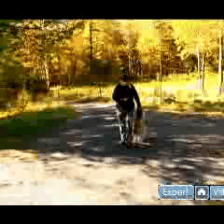

In [16]:
to_gif(sample_video1)

In [17]:
act_Recog(sample_video1)

Most likely to be:
  walking the dog       : 56.10%
  training dog          : 11.41%
  pushing car           :  9.65%
  jogging               :  8.92%
  lunge                 :  2.65%
  riding or walking with horse:  1.08%
  pushing cart          :  0.86%
  blowing leaves        :  0.77%
  throwing ball         :  0.72%
  riding scooter        :  0.64%


In [18]:
##Sample 3
video_path = fetch_ucf_video("v_RockClimbingIndoor_g01_c01.avi")
sample_video = load_video(video_path)
sample_video1 = load_video(video_path)[:100]
sample_video.shape

Fetching https://www.crcv.ucf.edu/THUMOS14/UCF101/UCF101/v_RockClimbingIndoor_g01_c01.avi => /tmp/tmpuo9g5m4q/v_RockClimbingIndoor_g01_c01.avi


(529, 224, 224, 3)


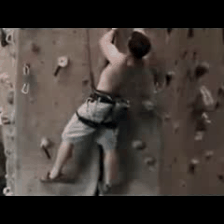

In [19]:
to_gif(sample_video1)

In [20]:
act_Recog(sample_video1)

Most likely to be:
  plastering            : 56.19%
  rock climbing         : 39.72%
  taking a shower       :  1.87%
  opening bottle        :  0.19%
  throwing axe          :  0.17%
  spray painting        :  0.16%
  spraying              :  0.14%
  robot dancing         :  0.12%
  playing cricket       :  0.11%
  laying bricks         :  0.07%
